# Лаб 4: Обробка зображень та робота з наборами файлів цифрових зображень
### **Мета:** Отримати знання та навики в обробці цифрових зображень за допомогою бібліотек Pillow та/або OpenCV та роботі з обробки набору зображень.

### Завдання 1. Робота з набором файлів.
1) Сформувати в папці на диску набір із 15 зображень різних форматів, 
розмірів та колірних моделей. Додати туди 2-3 файли, що не є зображеннями. 

2) Створити функцію, що в якості аргумента приймає адресу папки на диску
та повертає датафрейм з наступною інформацією про зображення, що 
знаходяться в папці:
- ім’я файлу;
- кольорову модель;
- формат;
- кількість каналів у зображенні;
- розмір файлу у мегабайтах байтах, округлених до двох знаків після 
коми;
- ширину картинки;
- висоту картинки;
- повний шлях до файлу;
- зменшене зображення.

Зауваження:

а) Якщо файл не є зображенням не додавати інформацію про нього в 
датафрейм.

б) Для обробки набору файлів можете скористатися вбудованими модулями
glob (https://docs.python.org/3/library/glob.html), або zipfile
https://docs.python.org/3/library/zipfile.html

в) Для відображення картинки в датафреймі можете скористатись методом, 
описаним в наступному матеріалі

Файл images\sample1.heic не є допустимим форматом зображенням.
Файл images\Лабораторна робота 4.pdf не є допустимим форматом зображенням.


,name,color model,format,channels,size (MB),width,height,full path,image
0,2GU.gif,P,GIF,1,2.04,200,200,D:\Jupyter Project\Python_lab4\images\2GU.gif,
1,Aq.gif,P,GIF,1,1.96,200,113,D:\Jupyter Project\Python_lab4\images\Aq.gif,
2,boat-4899802_1280.jpg,RGB,JPEG,3,0.36,200,113,D:\Jupyter Project\Python_lab4\images\boat-4899802_1280.jpg,
3,bunny-7847028_1280.jpg,RGB,JPEG,3,0.22,200,133,D:\Jupyter Project\Python_lab4\images\bunny-7847028_1280.jpg,
4,cat-7245850_1280.jpg,RGB,JPEG,3,0.19,200,133,D:\Jupyter Project\Python_lab4\images\cat-7245850_1280.jpg,
5,field-6574455_1280.jpg,RGB,JPEG,3,0.31,200,133,D:\Jupyter Project\Python_lab4\images\field-6574455_1280.jpg,
6,ImPS.gif,P,GIF,1,0.12,200,200,D:\Jupyter Project\Python_lab4\images\ImPS.gif,
7,mountain-6815304_1280.jpg,RGB,JPEG,3,0.10,200,133,D:\Jupyter Project\Python_lab4\images\mountain-6815304_1280.jpg,
8,owl-50267_1280.jpg,RGB,JPEG,3,0.44,200,150,D:\Jupyter Project\Python_lab4\images\owl-50267_1280.jpg,
9,pngwing.com (7).png,RGBA,PNG,4,0.22,165,200,D:\Jupyter Project\Python_lab4\images\pngwing.com (7).png,

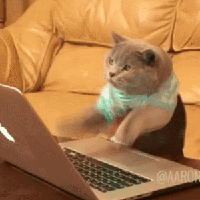
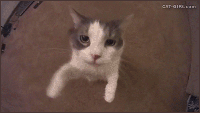
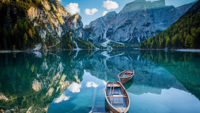
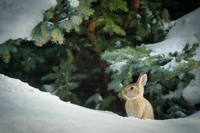
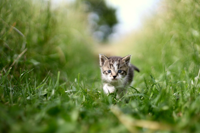
...
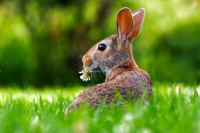
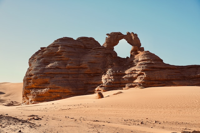
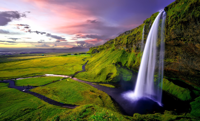
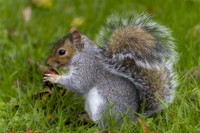
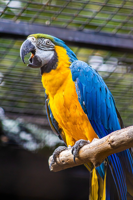

In [102]:
import os
from PIL import Image, UnidentifiedImageError
from IPython.display import display, HTML
import pandas as pd
import glob
from io import BytesIO
import base64


# Створення мініатюри зображення і кодування в Base64
def create_thumbnail_base64(img):
    img.thumbnail((200, 200))
    buffer = BytesIO()
    img.save(buffer, format='PNG')
    img_base64 = base64.b64encode(buffer.getvalue()).decode()
    return f'<img src="data:image/png;base64,{img_base64}" />'


# Функція для обробки зображень у папці
def process_images(folder_path):
    image_data = []
    files = glob.glob(os.path.join(folder_path, '*'))

    for file_path in files:
        try:
            with Image.open(file_path) as img:
                # Генеруємо HTML-код для мініатюри у Base64
                img_thumbnail_html = create_thumbnail_base64(img)

                # Додаємо інформацію до списку
                image_data.append({
                    'name': os.path.basename(file_path),
                    'color model': img.mode,
                    'format': img.format,
                    'channels': len(img.getbands()),
                    'size (MB)': round(os.path.getsize(file_path) / (1024 * 1024), 2),
                    'width': img.width,
                    'height': img.height,
                    'full path': os.path.abspath(file_path),
                    'image': img_thumbnail_html
                })
        except UnidentifiedImageError:
            print(f"Файл {file_path} не є допустимим форматом зображенням.")
    return pd.DataFrame(image_data)


folder_path = 'images'
image_df = process_images(folder_path)

HTML(image_df.to_html(escape=False))

### Завдання 2
Створити функцію, що в якості аргумента приймає:
- шлях до папки;
- назва вихідного зображення;
- кількість зображень в рядку;
- кількість зображень в стовпчику

і повертає зображення постера. 

Вважаємо, що постер є прямокутним і число картинок в постері a x b, де а –
число стовпчиків, а b – число рядків.

Зауваження:

1) Створити функцію, що перетворює картинку на квадрат з максимально 
можливим розміром сторони (наприклад, якщо картинка розміром 800x533, 
то вихідний розмір повинен бути 533x533). Обрізаємо картинку з двох країв, 
тобто розмір розраховуємо від центру.
2) Всі картинки, з яких створено постер, повинні бути однакового розміру, 
Тобто після обрізки необхідно змінити розмір, наприклад, на 500x500.
3) Картинки для додавання в постер обирати випадковим чином. Картинки 
можуть повторюватись.
4) На картинку «накласти фільтр» червоного, зеленого, синього, жовтого, 
пурпурного або голубого кольорів, що також обираються випадковим чином 
та можуть повторюватись.
5) Надати 3-4 варіанти постерів, що збережено у файлах на диску.
6) Використовувати зображення, що знаходяться в папці, що сформована в 
завданні 1
7) Для обробки зображень використовувати бібліотеки Pillow та/або OpenCV.

In [103]:
import random

# Функція для обробки зображення до квадратного формату
def crop_to_square(img):
    min_side = min(img.size)
    left = (img.width - min_side) / 2
    top = (img.height - min_side) / 2
    right = (img.width + min_side) / 2
    bottom = (img.height + min_side) / 2
    return img.crop((left, top, right, bottom))

# Функція для накладання кольорового фільтра
def apply_color_filter(img, color):
    overlay = Image.new('RGB', img.size, color)
    return Image.blend(img, overlay, 0.3)

# Функція для фільтрації та відкриття зображень у форматі RGB
def filter_rgb_images(folder_path):
    rgb_images = []
    for file_path in glob.glob(os.path.join(folder_path, "*")):
        try:
            with Image.open(file_path) as img:
                if img.mode == 'RGB':
                    rgb_images.append(img.copy())
        except UnidentifiedImageError:
            print(f"Пропуск файлу {file_path}, так як він не є допустимим зображенням.")
    return rgb_images

# Створення постера
def create_poster(folder_path, output_name, columns, rows):
    rgb_images = filter_rgb_images(folder_path)
    if not rgb_images:
        print("В папці немає зображень у форматі RGB.")
        return

    # Визначаємо розмір кожного зображення після обробки
    size = 500
    poster_width = columns * size
    poster_height = rows * size
    poster = Image.new('RGB', (poster_width, poster_height))
    color_filters = ['red', 'green', 'blue', 'yellow', 'purple', 'cyan']
    
    for row in range(rows):
        for col in range(columns):
            # Випадково вибираємо зображення та колірний фільтр
            img = random.choice(rgb_images)
            color = random.choice(color_filters)
            
            # Обрізаємо зображення, накладаємо фільтр та вставляємо зображення
            img = crop_to_square(img).resize((size, size))
            img = apply_color_filter(img, color)
            poster.paste(img, (col * size, row * size))

    poster.save(output_name)
    print(f"Постер збережено як {output_name}")
    return poster

Пропуск файлу images\sample1.heic, так як він не є допустимим зображенням.
Пропуск файлу images\Лабораторна робота 4.pdf, так як він не є допустимим зображенням.
Постер збережено як poster2x2.jpg


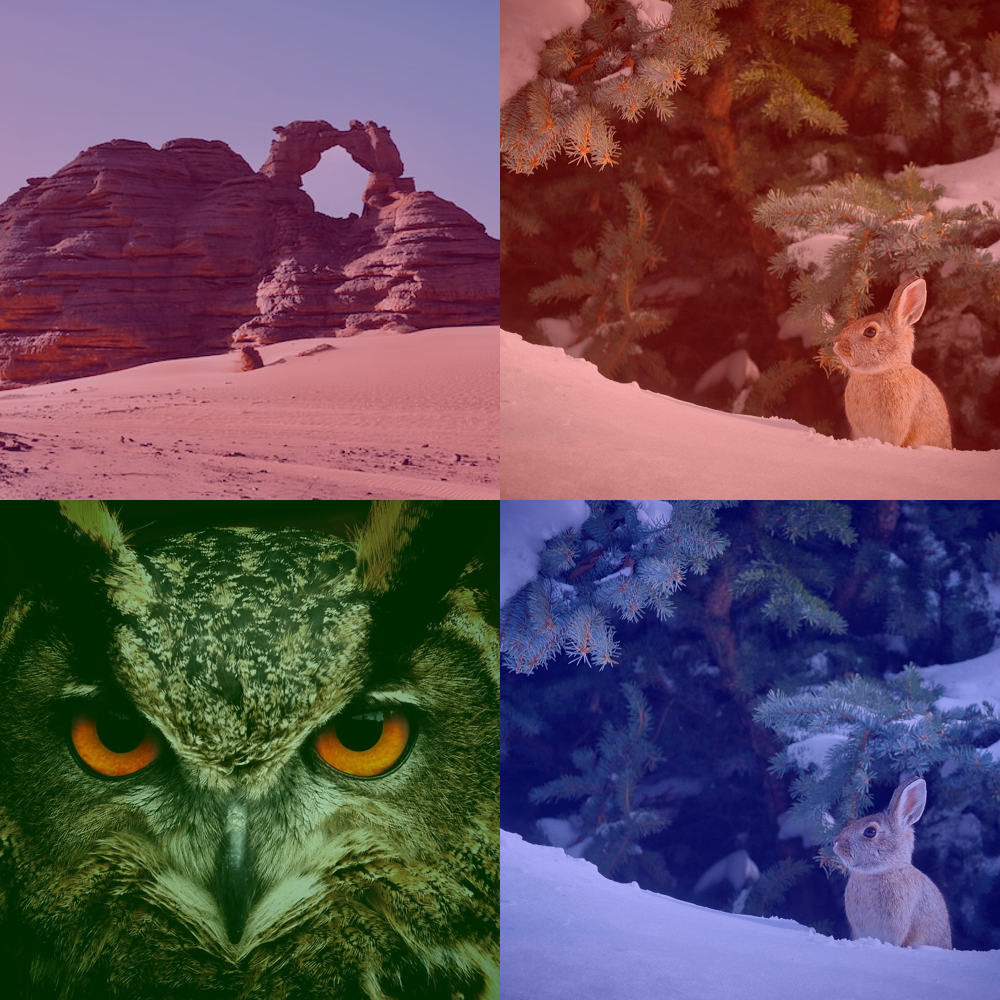

In [104]:
create_poster('images', 'poster2x2.jpg', 2, 2)

Пропуск файлу images\sample1.heic, так як він не є допустимим зображенням.
Пропуск файлу images\Лабораторна робота 4.pdf, так як він не є допустимим зображенням.
Постер збережено як poster3x2.jpg


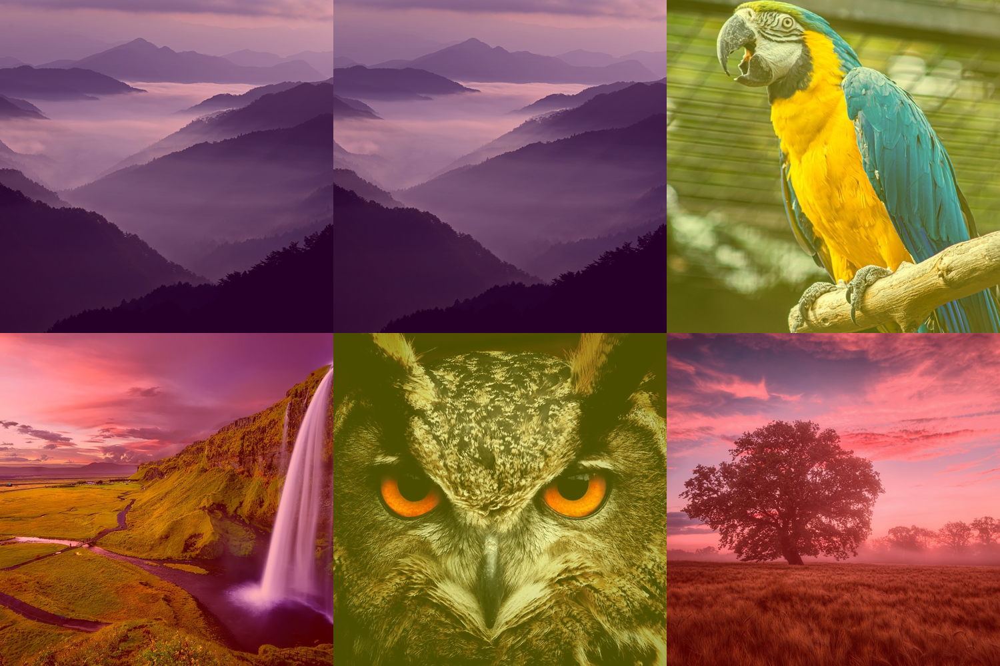

In [105]:
create_poster('images', 'poster3x2.jpg', 3, 2)

Пропуск файлу images\sample1.heic, так як він не є допустимим зображенням.
Пропуск файлу images\Лабораторна робота 4.pdf, так як він не є допустимим зображенням.
Постер збережено як poster3x3.jpg


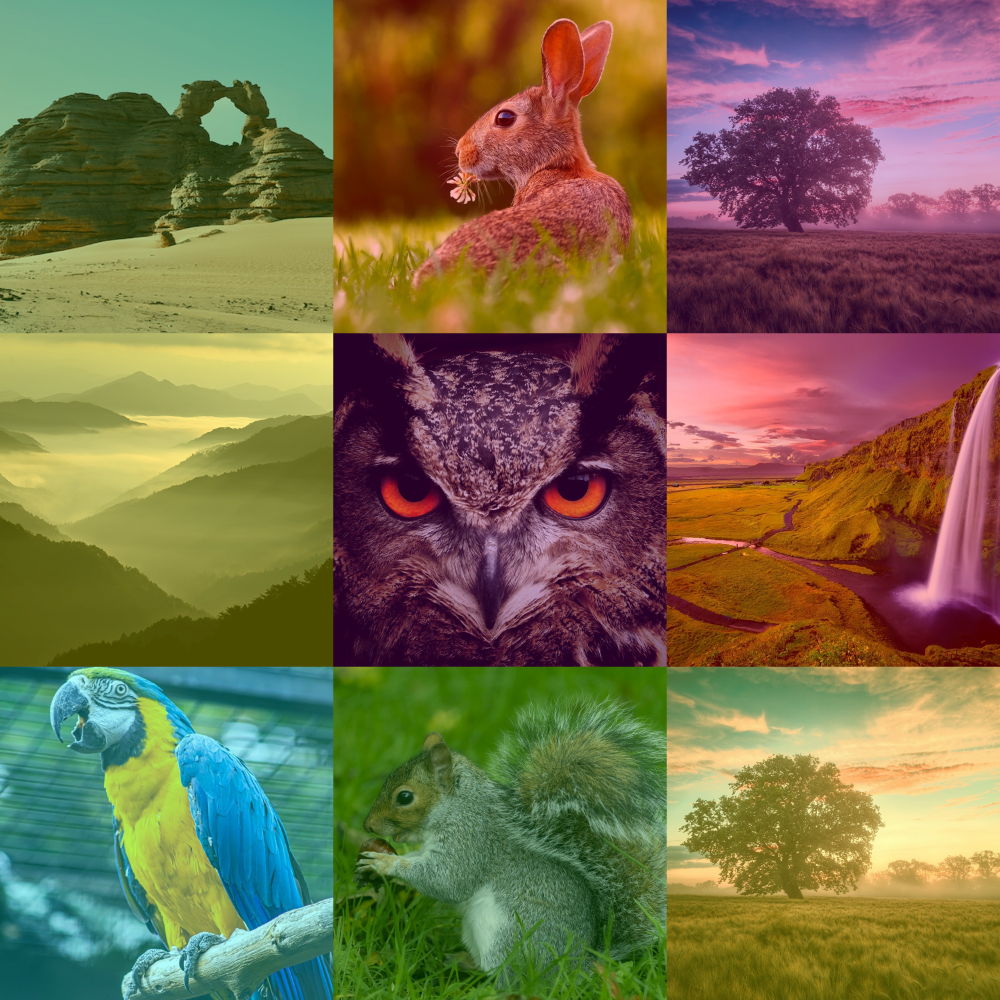

In [106]:
create_poster('images', 'poster3x3.jpg', 3, 3)